In [2]:
# import matplotlib.pyplot as plot
from matplotlib import pyplot as plt
import numpy as np

import pandas as pd
import scipy.io
import mat73
import math 
import pickle 
import random 

from scipy.ndimage import gaussian_filter
from scipy import ndimage
# from matplotlib.pyplot import figure


In [3]:
##  GET INDICES OF SPECIFIC TRIALS. WE CAN USE THESE INDICES LATER TO GET POKEIN ETC OF THE TRIALS WE ARE INTERESTED IN 

## use indices during all odor a,b,c,d presentations, and not just trials when all are inseq: 
## select only correct inseq trials:

def get_inseq_odors_local(pretrialbehav):

    x = np.transpose(pretrialbehav['Odor'])
    idx_1 = [i for i in range(0,len(x)) if int(x[i])== 1 ]
    idx_2 = [i for i in range(0,len(x)) if int(x[i])== 2 ]
    idx_3 = [i for i in range(0,len(x)) if int(x[i])== 3 ]
    idx_4 = [i for i in range(0,len(x)) if int(x[i])== 4 ]
    idx_5 = [i for i in range(0,len(x)) if int(x[i])== 5 ]

    all_trials = {}
    key_list = ["1","2","3","4","5"]
    value_list = [idx_1,idx_2,idx_3,idx_4,idx_5]

    #get pairs of elements: 
    zip_iterator = zip(key_list,value_list)
    all_trials = dict(zip_iterator)

    import math 

    for k,v in all_trials.items():
        idx = all_trials[k]
        x = np.transpose(pretrialbehav['Performance'])
        selected_performance = x[idx]
        x = np.transpose(pretrialbehav['PokeDuration']) 
        selected_durations = x[idx]
        x = np.transpose(pretrialbehav['Position'])
        selected_positions = x[idx]
        for i in range(len(idx)-1):
        # for inseq odors, check for timming erros and don't mark them as incorrect 
            if selected_performance[i] == 0 and selected_positions[i] == int(k) and selected_durations[i] > 1.05 :
                idx[i] = idx[i]
            elif selected_performance[i] == 1 and selected_positions[i] == int(k):
                idx[i] = idx[i]
            else: 
                idx[i] = np.nan 

    #     print(idx)
        idx_sel = [i for i in idx if math.isnan(i) == False]
        all_trials[k] = idx_sel
        
    # get POKEIN indices 
    x = np.transpose(pretrialbehav['PokeInIndex'])
    pokein_o0 = x[all_trials['1']]
    pokein_o1 = x[all_trials['2']]
    pokein_o2 = x[all_trials['3']]
    pokein_o3 = x[all_trials['4']]
    pokein_o4 = x[all_trials['5']]

    pokein = np.concatenate([pokein_o0,pokein_o1,pokein_o2,pokein_o3,pokein_o4])

    key_list = ['1','2','3','4','5']
    value_list = [pokein_o0,pokein_o1,pokein_o2,pokein_o3,pokein_o4]
    zip_iterator = zip(key_list,value_list)
    pokein_dict = dict(zip_iterator)

    print(pokein_o0.shape)
    print(pokein_o1.shape)
    print(pokein_o2.shape)
    print(pokein_o3.shape)
    print(pokein_o4.shape)
    print(pokein.shape)


    # get pokeout 
    x = np.transpose(pretrialbehav['PokeOutIndex'])
    pokeout_o0 = x[all_trials['1']]
    pokeout_o1 = x[all_trials['2']]
    pokeout_o2 = x[all_trials['3']]
    pokeout_o3 = x[all_trials['4']]
    pokeout_o4 = x[all_trials['5']]

    pokeout = np.concatenate([pokeout_o0,pokeout_o1,pokeout_o2,pokeout_o3,pokeout_o4])

        
    return (all_trials,pokein_o0, pokein_o1,pokein_o2, pokein_o3, pokein_o4, pokeout_o0, pokeout_o1, pokeout_o2, pokeout_o3, pokeout_o4)
  

In [4]:

## DEFINE FUNCTION TO GET 2 CONSECUTIVE INSEQ ODORS: 

def get_inseq_odor_E(pretrialbehav, odor_int):
    
    x = np.transpose(pretrialbehav['Odor'])
    
    if odor_int == 5:
        odor_int_next = 1
    else: 
        odor_int_next = odor_int + 1

    sublist= [odor_int,odor_int_next] #[1, 2, 3, 4]

    inseq = [i for i in range(0,len(x)) if list(x[i:i+len(sublist)])==sublist]
    #print(inseq)

    x = np.transpose(pretrialbehav['Position'])
    #to recheck:
    pos = [i for i in range(0,len(x)) if list(x[i:i+len(sublist)])==sublist]
    #print(pos)
    print('check if this is 0: ',len(np.intersect1d(inseq,pos)) - len(inseq))

    return inseq; 



In [14]:
# function to convolve spikes over a gaussian . Here I specify the start index, and then the length  : 
def get_gaussian_spikes_length(sigma,spiking, start_time,length):
    # convolve spikes over a gaussian : 
    spikes_gaussian = {} 
    for trial in range(len(start_time)):
        spikes = spiking[start_time[trial][0][0][0]:start_time[trial][0][0][0]+length,1:spiking.shape[1]]
        spikes_gaussian_indiv = np.zeros([spikes.shape[0],spikes.shape[1]])
        for neuron in range(spikes.shape[1]):
            spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))

        spikes_gaussian[trial] = spikes_gaussian_indiv
        
    return(spikes_gaussian)
    

In [6]:
# function to convolve spikes over a gaussian. Here I specify the start index and also the end index : 
def get_gaussian_spikes(sigma,spiking,end_time, start_time):
    # convolve spikes over a gaussian : 
    spikes_gaussian = {} 
    for trial in range(len(pokein_first_odor)):
        spikes = spiking[start_time[trial][0][0][0]:end_time[trial][0][0][0],1:spiking.shape[1]]
        spikes_gaussian_indiv = np.zeros([spikes.shape[0],spikes.shape[1]])
        for neuron in range(spikes.shape[1]):
            spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))

        spikes_gaussian[trial] = spikes_gaussian_indiv
        
    return(spikes_gaussian)
    

In [7]:
# sorting function 

def sort_neurons(spikes_gaussian, trial):
    spike_idx_indiv = np.zeros([spikes_gaussian[trial].shape[1]])
    for neuron in range(spikes_gaussian[trial].shape[1]):
        if (np.isnan(np.sum(spikes_gaussian[trial][:,neuron])) == False):
            spike_idx_indiv[neuron] = np.where(spikes_gaussian[trial][:,neuron] ==1)[0][0]
        else :
            spike_idx_indiv[neuron] = np.nan

#     np.sort(spike_idx_indiv)
    
    return(np.argsort(spike_idx_indiv),spikes_gaussian[trial][:,np.argsort(spike_idx_indiv)])
    
    

In [8]:
# sorting function - to the max

def sort_neurons_mean(spikes_gaussian_mean):
    spike_idx_indiv = np.zeros([spikes_gaussian_mean.shape[1]])
    for neuron in range(spikes_gaussian_mean.shape[1]):
        if (np.isnan(np.sum(spikes_gaussian_mean[:,neuron])) == False):
            spike_idx_indiv[neuron] = np.where(spikes_gaussian_mean[:,neuron] ==np.max(spikes_gaussian_mean[:,neuron]))[0][0]
        else :
            spike_idx_indiv[neuron] = np.nan

#     np.sort(spike_idx_indiv)
    
    return(np.argsort(spike_idx_indiv),spikes_gaussian_mean[:,np.argsort(spike_idx_indiv)])
    
    

In [138]:
behav_mat = scipy.io.loadmat('Barat_BehaviorMatrix.mat') #Barat_BehaviorMatrix.mat
ensemble_mat = mat73.loadmat('Barat_EnsembleMatrix.mat')
behav_info = scipy.io.loadmat('Barat_preTrialBehavmatrix.mat') #behav_info.mat #Barat_preTrialBehavmatrix

pretrialbehav = behav_info["preTrialBehavMatrix"]
spiking = ensemble_mat["ensembleMatrix"]  #FIRST COLUMN IS THE TIME, THE REST ARE THE ACTIVITIES OF SINGLE UNITS 


In [123]:
behav_mat['behavMatrixColIDs']

array([[array(['TimeBin'], dtype='<U7'), array(['Odor1'], dtype='<U5'),
        array(['Odor2'], dtype='<U5'), array(['Odor3'], dtype='<U5'),
        array(['Odor4'], dtype='<U5'), array(['Odor5'], dtype='<U5'),
        array(['Position1'], dtype='<U9'),
        array(['Position2'], dtype='<U9'),
        array(['Position3'], dtype='<U9'),
        array(['Position4'], dtype='<U9'),
        array(['Position5'], dtype='<U9'),
        array(['InSeqLog'], dtype='<U8'),
        array(['PerformanceLog'], dtype='<U14'),
        array(['PokeEvents'], dtype='<U10'),
        array(['FrontReward'], dtype='<U11'),
        array(['BackReward'], dtype='<U10'),
        array(['XvalRatMazePosition'], dtype='<U19'),
        array(['YvalRatMazePosition'], dtype='<U19')]], dtype=object)

Text(0.5, 1.0, 'acitivity of a neuron during the session')

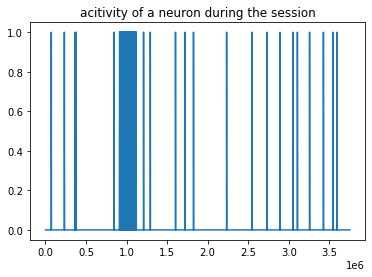

In [133]:
plt.plot(spiking[:,1])
plt.title('acitivity of a neuron during the session')

In [139]:
# get inseq trial indices for poke in and poke out 

(all_trials,pokein_o0, pokein_o1,pokein_o2, pokein_o3, pokein_o4, pokeout_o0, pokeout_o1, pokeout_o2, pokeout_o3, pokeout_o4) = get_inseq_odors_local(pretrialbehav)

pokein = np.concatenate([pokein_o0,pokein_o1,pokein_o2,pokein_o3,pokein_o4])
key_list = ['1','2','3','4','5']
value_list = [pokein_o0,pokein_o1,pokein_o2,pokein_o3,pokein_o4]
zip_iterator = zip(key_list,value_list)
pokein_dict = dict(zip_iterator)

pokeout = np.concatenate([pokeout_o0,pokeout_o1,pokeout_o2,pokeout_o3,pokeout_o4])
key_list = ['1','2','3','4','5']
value_list = [pokeout_o0,pokeout_o1,pokeout_o2,pokeout_o3,pokeout_o4]
zip_iterator = zip(key_list,value_list)
pokeout_dict = dict(zip_iterator)


(48, 1)
(35, 1)
(25, 1)
(26, 1)
(21, 1)
(155, 1)


In [144]:
pokein_dict['2']

array([[array([[154262]])],
       [array([[242877]])],
       [array([[318419]])],
       [array([[396231]])],
       [array([[455930]])],
       [array([[492638]])],
       [array([[537447]])],
       [array([[676256]])],
       [array([[769214]])],
       [array([[861521]])],
       [array([[914666]])],
       [array([[961667]])],
       [array([[1080768]])],
       [array([[1218170]])],
       [array([[1323352]])],
       [array([[1442047]])],
       [array([[1579944]])],
       [array([[1633152]])],
       [array([[1730307]])],
       [array([[1769940]])],
       [array([[1841819]])],
       [array([[1954708]])],
       [array([[2040261]])],
       [array([[2284907]])],
       [array([[2510176]])],
       [array([[2698252]])],
       [array([[2779785]])],
       [array([[2821748]])],
       [array([[2853725]])],
       [array([[2904933]])],
       [array([[2952249]])],
       [array([[3133102]])],
       [array([[3419682]])],
       [array([[3563139]])],
       [array([[3568238]])

In [32]:
sigma = 150 
length = 1200
# end_time = pokeout_o0 #pokein_second_odor

start_time = pokein_o0 #pokein_first_odor
spikes_gaussian_a = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o1 #pokein_first_odor
spikes_gaussian_b = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o2 #pokein_first_odor
spikes_gaussian_c = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o3 #pokein_first_odor
spikes_gaussian_d = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o4 #pokein_first_odor
spikes_gaussian_e = get_gaussian_spikes_length(sigma,spiking, start_time,length)



C:\Users\FORTIN~1\AppData\Local\Temp/ipykernel_4200/3351525590.py:9: RuntimeWarning: invalid value encountered in true_divide
  spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))


Text(0.5, 1.0, 'actiivty of a neuron after - gaussian kernel smoothing')

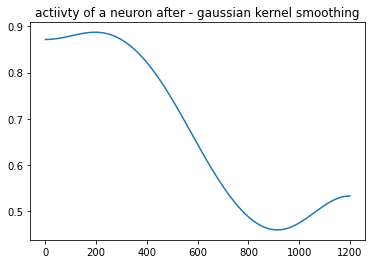

In [137]:
plt.plot(spikes_gaussian_a[:,1])
plt.title('actiivty of a neuron after - gaussian kernel smoothing')

In [ ]:
# get the avg activity during all odor a trials : 
avg_gaussian_a = get_avg_spiking(spikes_gaussian_a_rat1)

In [ ]:
# plot PSTH

[sort_idx , sorted_gaussian] = sort_neurons_mean(avg_gaussian_a) 
plt.imshow(np.flip(sorted_gaussian.T,1), cmap='viridis', interpolation='nearest', aspect='auto')
# plt.ylim([0,45])

In [ ]:
sigma = 150 
length = 1200
# end_time = pokeout_o0 #pokein_second_odor

start_time = pokein_o0 #pokein_first_odor
spikes_gaussian_a_rat1 = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o1 #pokein_first_odor
spikes_gaussian_b_rat1 = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o2 #pokein_first_odor
spikes_gaussian_c_rat1 = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o3 #pokein_first_odor
spikes_gaussian_d_rat1 = get_gaussian_spikes_length(sigma,spiking, start_time,length)

##
start_time = pokein_o4 #pokein_first_odor
spikes_gaussian_e_rat1 = get_gaussian_spikes_length(sigma,spiking, start_time,length)



In [59]:
avg_gaussian_a_rat1 = get_avg_spiking(spikes_gaussian_a_rat1)
avg_gaussian_b_rat1 = get_avg_spiking(spikes_gaussian_b_rat1)
avg_gaussian_c_rat1 = get_avg_spiking(spikes_gaussian_c_rat1)
avg_gaussian_d_rat1 = get_avg_spiking(spikes_gaussian_d_rat1)
avg_gaussian_e_rat1 = get_avg_spiking(spikes_gaussian_e_rat1)

avg_gaussian_a_rat2 = get_avg_spiking(spikes_gaussian_a_rat2)
avg_gaussian_b_rat2 = get_avg_spiking(spikes_gaussian_b_rat2)
avg_gaussian_c_rat2 = get_avg_spiking(spikes_gaussian_c_rat2)
avg_gaussian_d_rat2 = get_avg_spiking(spikes_gaussian_d_rat2)
avg_gaussian_e_rat2 = get_avg_spiking(spikes_gaussian_e_rat2)

avg_gaussian_a_rat3 = get_avg_spiking(spikes_gaussian_a_rat3)
avg_gaussian_b_rat3 = get_avg_spiking(spikes_gaussian_b_rat3)
avg_gaussian_c_rat3 = get_avg_spiking(spikes_gaussian_c_rat3)
avg_gaussian_d_rat3 = get_avg_spiking(spikes_gaussian_d_rat3)
avg_gaussian_e_rat3 = get_avg_spiking(spikes_gaussian_e_rat3)

avg_gaussian_a_rat4 = get_avg_spiking(spikes_gaussian_a_rat4)
avg_gaussian_b_rat4 = get_avg_spiking(spikes_gaussian_b_rat4)
avg_gaussian_c_rat4 = get_avg_spiking(spikes_gaussian_c_rat4)
avg_gaussian_d_rat4 = get_avg_spiking(spikes_gaussian_d_rat4)
avg_gaussian_e_rat4 = get_avg_spiking(spikes_gaussian_e_rat4)

avg_gaussian_a_rat5 = get_avg_spiking(spikes_gaussian_a_rat5)
avg_gaussian_b_rat5 = get_avg_spiking(spikes_gaussian_b_rat5)
avg_gaussian_c_rat5 = get_avg_spiking(spikes_gaussian_c_rat5)
avg_gaussian_d_rat5 = get_avg_spiking(spikes_gaussian_d_rat5)
avg_gaussian_e_rat5 = get_avg_spiking(spikes_gaussian_e_rat5)


In [60]:
spikes_gaussian_a = np.hstack([avg_gaussian_a_rat1, avg_gaussian_a_rat2, avg_gaussian_a_rat3, avg_gaussian_a_rat4, avg_gaussian_a_rat5])
spikes_gaussian_b = np.hstack([avg_gaussian_b_rat1, avg_gaussian_b_rat2, avg_gaussian_b_rat3, avg_gaussian_b_rat4, avg_gaussian_b_rat5])
spikes_gaussian_c = np.hstack([avg_gaussian_c_rat1, avg_gaussian_c_rat2, avg_gaussian_c_rat3, avg_gaussian_c_rat4, avg_gaussian_c_rat5])
spikes_gaussian_d = np.hstack([avg_gaussian_d_rat1, avg_gaussian_d_rat2, avg_gaussian_d_rat3, avg_gaussian_d_rat4, avg_gaussian_d_rat5])
spikes_gaussian_e = np.hstack([avg_gaussian_e_rat1, avg_gaussian_e_rat2, avg_gaussian_e_rat3, avg_gaussian_e_rat4, avg_gaussian_e_rat5])


(0.0, 45.0)

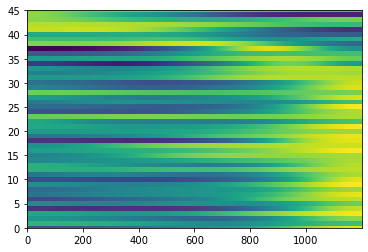

In [120]:
# [sort_idx , sorted_gaussian] = sort_neurons(avg_spiking, idx_less_duration[i])
[sort_idx , sorted_gaussian] = sort_neurons_mean(spikes_gaussian_a) 
plt.imshow(np.flip(sorted_gaussian.T,1), cmap='viridis', interpolation='nearest', aspect='auto')
plt.ylim([0,45])

In [42]:
def get_stacked_spiking(spikes_gaussian):
    stacked = spikes_gaussian[0].copy()
    for k,v in spikes_gaussian.items():
        stacked = np.dstack([stacked,spikes_gaussian[k]])

#     avg_spiking = np.mean(stacked, axis = 2)    
    return(stacked)

In [35]:
def get_avg_spiking(spikes_gaussian):
    stacked = spikes_gaussian[0].copy()
    for k,v in spikes_gaussian.items():
        stacked = np.dstack([stacked,spikes_gaussian[k]])

    avg_spiking = np.mean(stacked, axis = 2)
    
    return(avg_spiking)

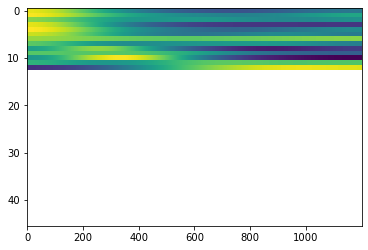

In [66]:
sort_idx.shape
sorted_gaussian.shape

(1200, 46)

In [34]:
## get average firing acitvity of  neurons during the 5 iti durations : 
durations_int = np.zeros([idx.shape[0]])
for i in range(idx.shape[0]):
    durations_int[i] = spikes_gaussian[idx[i]].shape[0]
    
np.min(durations_int)

spikes_gaussian_avg = np.zeros([int(np.min(durations_int)),spikes.shape[1],idx.shape[0]])
for i in range(idx.shape[0]):
    spikes_gaussian_avg[:,:,i] = spikes_gaussian[idx[i]][0:int(np.min(durations_int)),:]

spikes_gaussian_avg = np.mean(spikes_gaussian_avg,axis =2)


AttributeError: 'list' object has no attribute 'shape'

In [46]:


fig, axes = plt.subplots(idx_less_duration.shape[0],1, figsize = (3,20))
plt.suptitle('Superchris - Odor A-B')

for i in range(idx_less_duration.shape[0]):
    [sort_idx , sorted_gaussian] = sort_neurons(spikes_gaussian, idx_less_duration[i])
    axes[i].imshow(sorted_gaussian.T, cmap='viridis', interpolation='nearest', aspect='auto')
        
fig.tight_layout()
fig.subplots_adjust(top = 3/3.1)
# plt.savefig('rasters.png')
plt.show()


NameError: name 'idx_less_duration' is not defined

In [27]:
# pokein_o0

In [16]:
# odor_int = 5
# inseq = get_inseq_odor_E(pretrialbehav, odor_int)
# [pokein_second_e,pokeout_first_e,reward_e] = get_pokein_pokeout_iti(pretrialbehav,inseq)


In [8]:
## GET INSEQ CORRECT TRIALS : 
## FOR EXAMPLE, ODOR = 1, POSITION = 1, PERFORMACE = 1 
## ODOR = 2, POSITION = 2, PERFORMANCE = 1
## ODOR = 3, POSITION = 3, PERFORMANCE = 1 
## ODOR = 4, POSITION = 4, PERFORMANCE = 1 


odor_info = np.transpose(pretrialbehav['Odor'])
idx_1 = [i for i in range(0,len(odor_info)) if int(odor_info[i])== 1 ]
idx_2 = [i for i in range(0,len(odor_info)) if int(odor_info[i])== 2 ]
idx_3 = [i for i in range(0,len(odor_info)) if int(odor_info[i])== 3 ]
idx_4 = [i for i in range(0,len(odor_info)) if int(odor_info[i])== 4 ]
idx_5 = [i for i in range(0,len(odor_info)) if int(odor_info[i])== 5 ]

all_trials = {}
key_list = ["1","2","3","4","5"]
value_list = [idx_1,idx_2,idx_3,idx_4,idx_5]

#get pairs of elements: 
zip_iterator = zip(key_list,value_list)
all_trials = dict(zip_iterator)

import math 

for k,v in all_trials.items():
    idx = all_trials[k]
    odor_info = np.transpose(pretrialbehav['Performance'])
    selected_performance = odor_info[idx]
    odor_info = np.transpose(pretrialbehav['PokeDuration']) 
    selected_durations = odor_info[idx]
    odor_info = np.transpose(pretrialbehav['Position'])
    selected_positions = odor_info[idx]
    for i in range(len(idx)-1):
    # for inseq odors, check for timming erros and don't mark them as incorrect 
        if selected_performance[i] == 0 and selected_positions[i] == int(k) and selected_durations[i] > 1.05 :
            idx[i] = idx[i]
        elif selected_performance[i] == 1 and selected_positions[i] == int(k):
            idx[i] = idx[i]
        else: 
            idx[i] = np.nan 

    all_trials[k] = [i for i in idx if math.isnan(i) == False]
  



In [20]:
# get pokein index of any 2 consecutive inseq odors : 

first_odor = 1
consec_trials_inseq = get_consec_inseq(all_trials,first_odor)

In [28]:
# consec_trials_inseq['1']

In [29]:
# get ITI durations between the 2 consecutive inseq odors 
x = np.transpose(pretrialbehav['PokeInIndex'])
pokein_first_odor = x[consec_trials_inseq[str(first_odor)]]
pokein_second_odor = x[consec_trials_inseq[str(first_odor + 1)]]

x = np.transpose(pretrialbehav['PokeOutIndex'])
pokeout_first_odor = x[consec_trials_inseq[str(first_odor)]]
pokeout_second_odor = x[consec_trials_inseq[str(first_odor + 1)]]


iti_duration = np.zeros([len(pokein_second_odor)])
for i in range(len(pokein_second_odor)):
    iti_duration[i] = pokein_second_odor[i][0][0][0] -  pokeout_first_odor[i][0][0][0]
    

In [31]:
# pokein_first_odor

In [47]:
# create two groups of iti_durations. 1st group - longer durations ('idx'), we will use this to sort. 
# 2nd group - smaller duration ('idx_less_duration'), we will sort this according to the first group 

max_bin = bins[np.where(counts == np.max(counts))]+w
min_bin = bins[np.where(counts == np.max(counts))]-w
# print(np.where(iti_duration <max_bin))
# print(np.where(iti_duration >min_bin))

idx_less_duration = np.asarray(np.where(iti_duration <min_bin))[0]
print(idx_less_duration)
idx_less_duration = np.setdiff1d(idx_less_duration,idx)
idx = np.intersect1d(np.asarray(np.where(iti_duration <max_bin))[0],np.asarray(np.where(iti_duration >min_bin))[0])
idx

NameError: name 'bins' is not defined

In [559]:
# # create two groups of iti_durations. 1st group - longer durations ('idx'), we will use this to sort. 
# # 2nd group - smaller duration ('idx_less_duration'), we will sort this according to the first group 

# max_bin = 5300
# min_bin = 5100
# print(np.where(iti_duration <max_bin))
# print(np.where(iti_duration >min_bin))

# idx_less_duration = np.asarray(np.where(iti_duration >min_bin))[0]
# idx = np.intersect1d(np.asarray(np.where(iti_duration <max_bin))[0],np.asarray(np.where(iti_duration >min_bin))[0])
# idx

(array([ 0,  1,  3,  4,  5,  6,  8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25], dtype=int64),)
(array([ 0,  2,  4,  7,  8,  9, 15, 16], dtype=int64),)


array([ 0,  4,  8, 15, 16], dtype=int64)

In [577]:
# idx_less_duration = np.asarray(np.where(iti_duration <min_bin))[0]
# idx_less_duration = np.setdiff1d(idx_less_duration,idx)
# print(idx)
# idx_less_duration

[ 0  4  8 15 16]


array([ 1,  3,  5,  6, 10, 11, 12, 13, 14, 17, 18, 19, 20, 21, 22, 23, 24,
       25], dtype=int64)

In [688]:
# get gaussian spikes during ITI only: 
sigma = 150 
start_time = pokeout_first_odor#[trial][0][0][0]
end_time = pokein_second_odor#[trial][0][0][0]

spikes_gaussian_iti = get_gaussian_spikes(sigma,spiking,end_time, start_time)

# spikes_gaussian_iti = {} 
# for trial in range(len(pokein_first_odor)):
#     spikes = spiking[pokeout_first_odor[trial][0][0][0]:pokein_second_odor[trial][0][0][0],1:47]
#     spikes_gaussian_indiv = np.zeros([spikes.shape[0],spikes.shape[1]])
#     for neuron in range(spikes.shape[1]):
#         spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))
        
#     spikes_gaussian_iti[trial] = spikes_gaussian_indiv
    

C:\Users\FORTIN~1\AppData\Local\Temp/ipykernel_22468/1685474044.py:9: RuntimeWarning: invalid value encountered in true_divide
  spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))


In [689]:
spikes_gaussian_iti.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])

In [704]:
# get gaussian spikes from pokein of the first odor till pokein of the second odor 

sigma = 150 
start_time = pokein_first_odor#[trial][0][0][0]
end_time = pokein_second_odor#[trial][0][0][0]

spikes_gaussian = get_gaussian_spikes(sigma,spiking,end_time, start_time)


C:\Users\FORTIN~1\AppData\Local\Temp/ipykernel_22468/1685474044.py:9: RuntimeWarning: invalid value encountered in true_divide
  spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))


In [705]:
## get average firing acitvity of  neurons during the 5 iti durations : 
durations_int = np.zeros([idx.shape[0]])
for i in range(idx.shape[0]):
    durations_int[i] = spikes_gaussian[idx[i]].shape[0]
    
np.min(durations_int)

spikes_gaussian_avg = np.zeros([int(np.min(durations_int)),spikes.shape[1],idx.shape[0]])
for i in range(idx.shape[0]):
    spikes_gaussian_avg[:,:,i] = spikes_gaussian[idx[i]][0:int(np.min(durations_int)),:]

spikes_gaussian_avg = np.mean(spikes_gaussian_avg,axis =2)

In [644]:
idx.shape
spikes.shape

(4048, 46)

In [692]:
idx_dur = np.zeros([idx.shape[0]])
for i in range(idx.shape[0]):
    print('idx',i,':',spikes_gaussian[i].shape)
    idx_dur[i] = spikes_gaussian[i].shape[0]
print(idx_dur)


idx 0 : (7163, 46)
idx 1 : (6478, 46)
idx 2 : (4796, 46)
[7163. 6478. 4796.]


In [693]:
# get gaussian spikes from pokein till the length of the max duration  

length = int(np.max(idx_dur)) +100
start_time = pokein_first_odor#[trial][0][0][0]

spikes_gaussian_len = get_gaussian_spikes_length(sigma,spiking,end_time, start_time, length)


C:\Users\FORTIN~1\AppData\Local\Temp/ipykernel_22468/198065596.py:9: RuntimeWarning: invalid value encountered in true_divide
  spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))


In [694]:
spikes_gaussian_len.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])

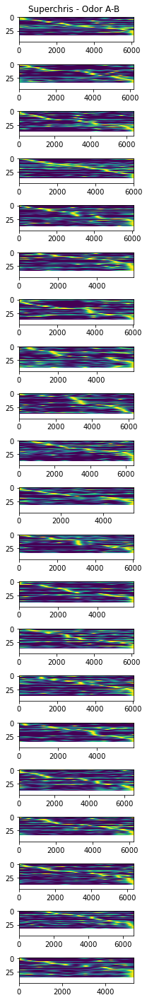

In [614]:
fig, axes = plt.subplots(idx_less_duration.shape[0],1, figsize = (3,20))
plt.suptitle('Superchris - Odor A-B')

for i in range(idx_less_duration.shape[0]):
    [sort_idx , sorted_gaussian] = sort_neurons(spikes_gaussian, idx_less_duration[i])
    axes[i].imshow(sorted_gaussian.T, cmap='viridis', interpolation='nearest', aspect='auto')
        
fig.tight_layout()
fig.subplots_adjust(top = 3/3.1)
# plt.savefig('rasters.png')
plt.show()


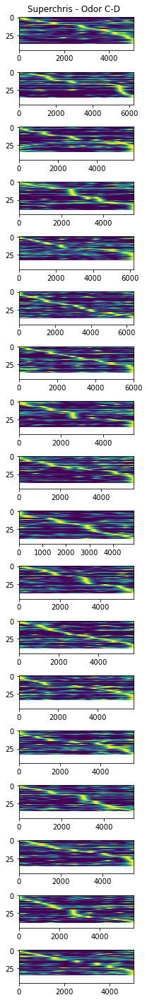

In [578]:
fig, axes = plt.subplots(idx_less_duration.shape[0],1, figsize = (3,20))
plt.suptitle('Superchris - Odor C-D')

for i in range(idx_less_duration.shape[0]):
    [sort_idx , sorted_gaussian] = sort_neurons(spikes_gaussian, idx_less_duration[i])
    axes[i].imshow(sorted_gaussian.T, cmap='viridis', interpolation='nearest', aspect='auto')
        
fig.tight_layout()
fig.subplots_adjust(top = 3/3.1)
# plt.savefig('rasters.png')
plt.show()


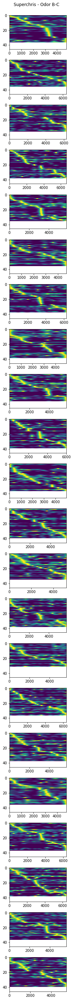

In [595]:
fig, axes = plt.subplots(idx_less_duration.shape[0],1, figsize = (3,40))
plt.suptitle('Superchris - Odor B-C')

for i in range(idx_less_duration.shape[0]):
    [sort_idx , sorted_gaussian] = sort_neurons(spikes_gaussian, idx_less_duration[i])
    axes[i].imshow(sorted_gaussian.T, cmap='viridis', interpolation='nearest', aspect='auto')
        
fig.tight_layout()
fig.subplots_adjust(top = 3/3.1)
# plt.savefig('rasters.png')
plt.show()


In [549]:
idx

array([ 1, 12, 18], dtype=int64)

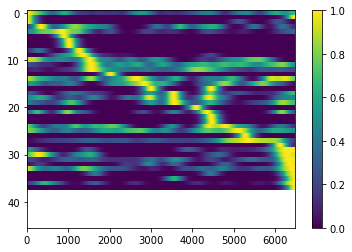

In [695]:
[sort_idx_0 , sorted_gaussian_0] = sort_neurons(spikes_gaussian, idx[0])
[sort_idx_1 , sorted_gaussian_1] = sort_neurons(spikes_gaussian, idx[1])
[sort_idx_2 , sorted_gaussian_2] = sort_neurons(spikes_gaussian, idx[2])
# [sort_idx_3 , sorted_gaussian_3] = sort_neurons(spikes_gaussian, idx[3])
# [sort_idx_4 , sorted_gaussian_4] = sort_neurons(spikes_gaussian, idx[4])

im = plt.imshow(sorted_gaussian_0.T, cmap='viridis', interpolation='nearest', aspect='auto')
plt.colorbar(im)

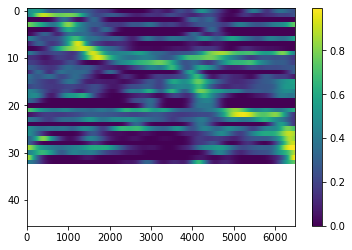

In [696]:
[sort_idx_mean , sorted_gaussian_mean] = sort_neurons_mean(spikes_gaussian_avg)
spikes_gaussian_avg


im = plt.imshow(sorted_gaussian_mean.T, cmap='viridis', interpolation='nearest', aspect='auto')
plt.colorbar(im)

In [708]:
i = 0
pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]

5315

In [706]:
# sort according toduration of pokein of the next odor :

to_sort = np.zeros([idx_less_duration.shape[0]])
for i in range(idx_less_duration.shape[0]):
    to_sort[i] = (pokein_second_odor[idx_less_duration[i]][0][0][0] - pokein_first_odor[idx_less_duration[i]][0][0][0])
    
np.argsort(to_sort)

idx_less_duration_sorted = idx_less_duration[np.argsort(to_sort)]
print(idx_less_duration)
idx_less_duration_sorted

[ 3  5  9 14 17 19 25 26 30 31 33 34 36 37 38 40 41 42 43 45 46]


array([46, 33, 36, 40, 19, 26, 14, 34, 38, 25, 17, 37,  3,  5, 42, 30, 43,
        9, 31, 41, 45], dtype=int64)

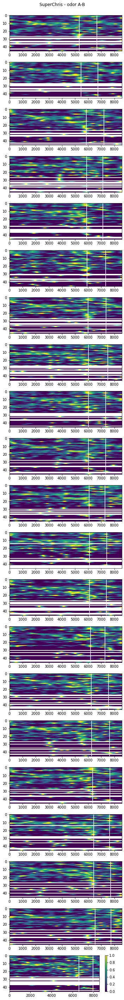

In [679]:

fig, axes = plt.subplots(idx_less_duration_sorted.shape[0],1, figsize = (5,40))

for i in range(idx_less_duration_sorted.shape[0]):
    im = axes[i].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_mean].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,1].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,2].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')    
#     axes[i,3].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     im = axes[i,4].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,1].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,2].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,1].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,2].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i].set_xlim([0,length])
#     axes[i,1].set_xlim([0,length])
#     axes[i,2].set_xlim([0,length])
#     axes[i,3].set_xlim([0,length])
#     axes[i,4].set_xlim([0,length])

fig.colorbar(im)
fig.tight_layout()
fig.suptitle('SuperChris - odor A-B')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()


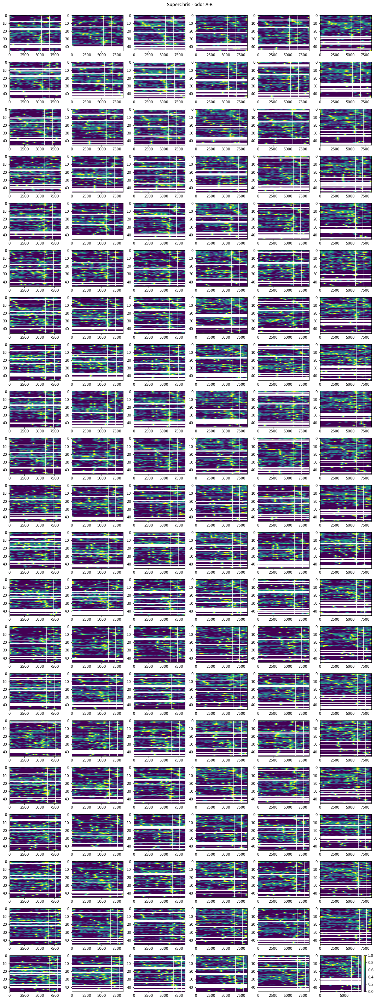

In [683]:
fig, axes = plt.subplots(idx_less_duration_sorted.shape[0],idx.shape[0]+1, figsize = (15,40))

for i in range(idx_less_duration_sorted.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,2].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')    
    axes[i,3].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,4].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    im = axes[i,5].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_mean].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,4].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,5].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,4].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,5].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
    axes[i,3].set_xlim([0,length])
    axes[i,4].set_xlim([0,length])
    axes[i,5].set_xlim([0,length])

fig.colorbar(im)
fig.tight_layout()
fig.suptitle('SuperChris - odor A-B')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()

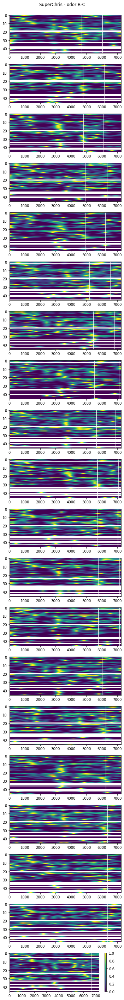

In [698]:

fig, axes = plt.subplots(idx_less_duration_sorted.shape[0],1, figsize = (5,40))

for i in range(idx_less_duration_sorted.shape[0]):
    im = axes[i].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_mean].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,1].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,2].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')    
#     axes[i,3].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     im = axes[i,4].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,1].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,2].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,1].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,2].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i].set_xlim([0,length])
#     axes[i,1].set_xlim([0,length])
#     axes[i,2].set_xlim([0,length])
#     axes[i,3].set_xlim([0,length])
#     axes[i,4].set_xlim([0,length])

fig.colorbar(im)
fig.tight_layout()
fig.suptitle('SuperChris - odor B-C')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()


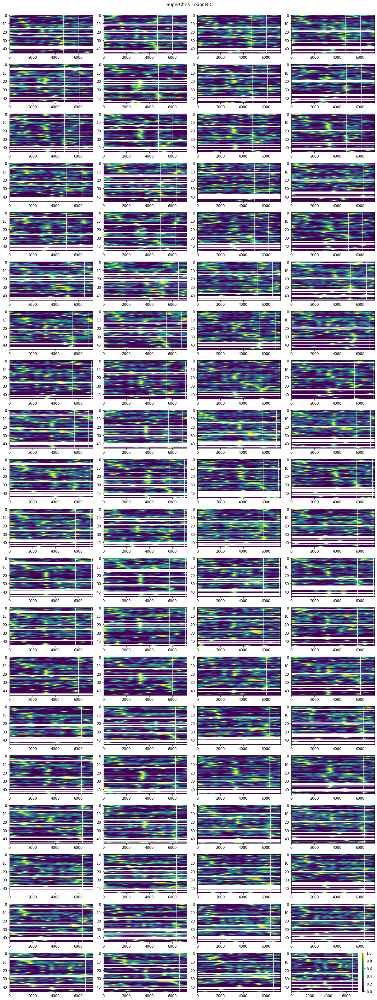

In [699]:
fig, axes = plt.subplots(idx_less_duration_sorted.shape[0],idx.shape[0]+1, figsize = (15,40))

for i in range(idx_less_duration_sorted.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,2].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')    
#     axes[i,3].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,4].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    im = axes[i,3].imshow(spikes_gaussian_len[idx_less_duration_sorted[i]][:,sort_idx_mean].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,5].axvline(x = (pokein_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,5].axvline(x = (pokeout_second_odor[idx_less_duration_sorted[i]][0][0][0] - pokein_first_odor[idx_less_duration_sorted[i]][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
    axes[i,3].set_xlim([0,length])
#     axes[i,4].set_xlim([0,length])
#     axes[i,5].set_xlim([0,length])

fig.colorbar(im)
fig.tight_layout()
fig.suptitle('SuperChris - odor B-C')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()

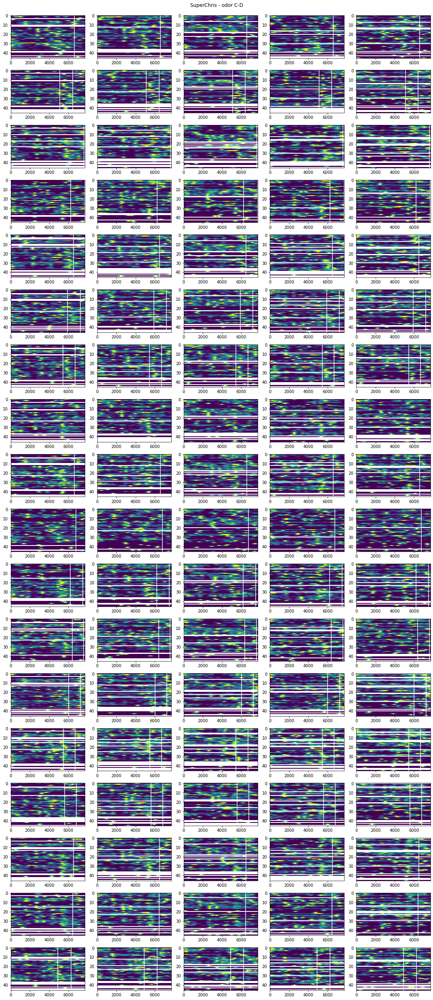

In [580]:
fig, axes = plt.subplots(idx_less_duration.shape[0],idx.shape[0], figsize = (15,35))

for i in range(idx_less_duration.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,2].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,3].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,4].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokein_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,4].axvline(x = (pokein_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].axvline(x = (pokeout_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokeout_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokeout_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokeout_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,4].axvline(x = (pokeout_second_odoridx_less_duration[i][0][0][0] - pokein_first_odoridx_less_duration[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
    axes[i,3].set_xlim([0,length])
    axes[i,4].set_xlim([0,length])


fig.tight_layout()
fig.suptitle('SuperChris - odor C-D')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()

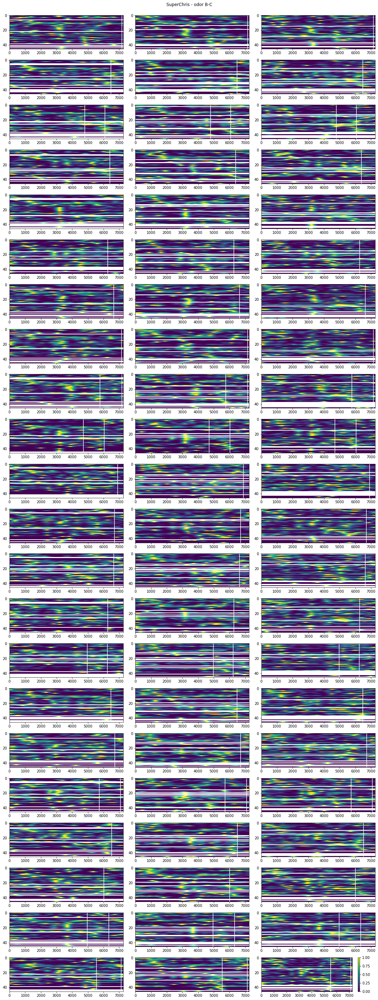

In [602]:
fig, axes = plt.subplots(idx_less_duration.shape[0],idx.shape[0], figsize = (15,40))

for i in range(idx_less_duration.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    im = axes[i,2].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    #     axes[i,3].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,4].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
#     axes[i,3].set_xlim([0,length])
#     axes[i,4].set_xlim([0,length])

fig.colorbar(im)
fig.tight_layout()
fig.suptitle('SuperChris - odor B-C')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()

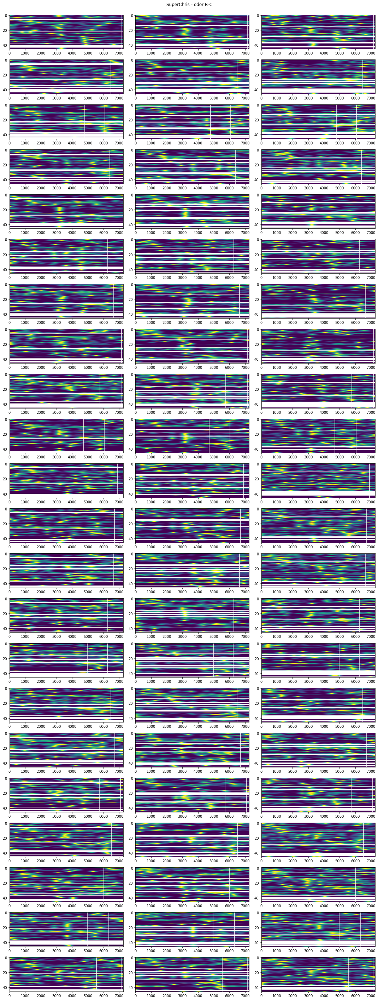

In [598]:
fig, axes = plt.subplots(idx_less_duration.shape[0],idx.shape[0], figsize = (15,40))

for i in range(idx_less_duration.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,2].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,3].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,4].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
#     axes[i,3].set_xlim([0,length])
#     axes[i,4].set_xlim([0,length])


fig.tight_layout()
fig.suptitle('SuperChris - odor B-C')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()

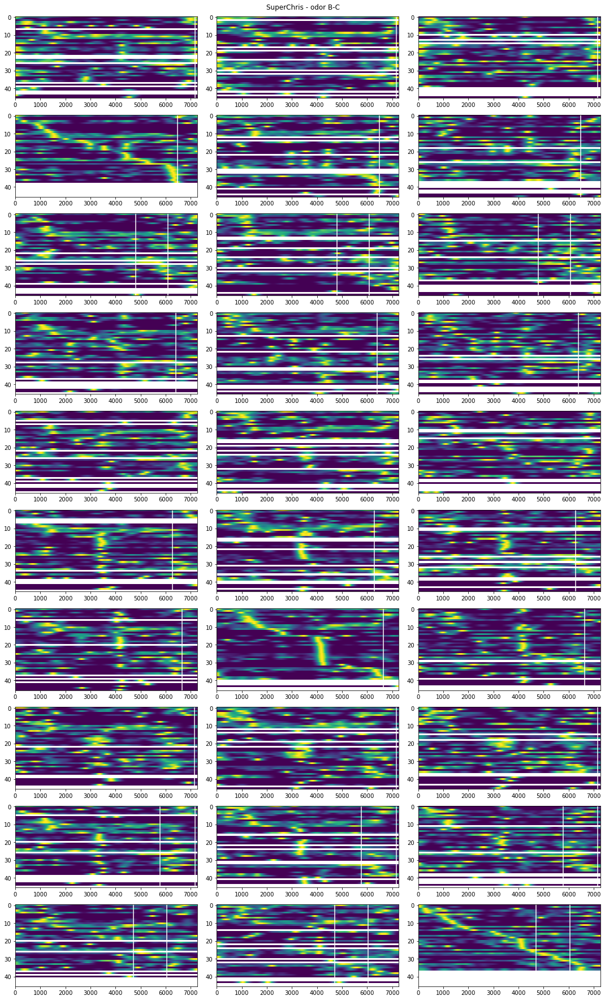

In [550]:
fig, axes = plt.subplots(idx_less_duration.shape[0],idx.shape[0], figsize = (15,25))

for i in range(idx_less_duration.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,2].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,3].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
#     axes[i,4].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,3].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
#     axes[i,4].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
#     axes[i,3].set_xlim([0,length])
#     axes[i,4].set_xlim([0,length])


fig.tight_layout()
fig.suptitle('SuperChris - odor B-C')
fig.subplots_adjust(top = 15/15.5)

# plt.savefig('rasters.png')
plt.show()

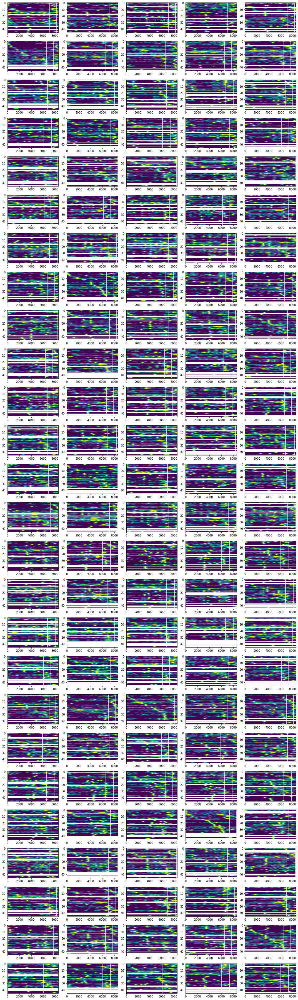

In [506]:
fig, axes = plt.subplots(idx_less_duration.shape[0],5, figsize = (15,50))

for i in range(idx_less_duration.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,2].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,3].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,4].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,4].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,4].axvline(x = (pokeout_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')

    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
    axes[i,3].set_xlim([0,length])
    axes[i,4].set_xlim([0,length])


fig.tight_layout()
fig.suptitle('SuperChris - odor A-B')
fig.subplots_adjust(top = 15/15.1)

# plt.savefig('rasters.png')
plt.show()

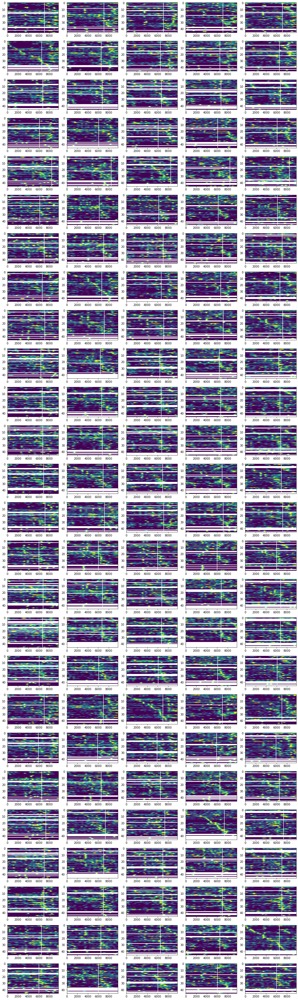

In [497]:
# sorted according to pokein of 1st till pokeout of 2nd odor 

fig, axes = plt.subplots(idx_less_duration.shape[0],5, figsize = (15,50))

for i in range(idx_less_duration.shape[0]):
    axes[i,0].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_0].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,1].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_1].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,2].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_2].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,3].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
    axes[i,4].imshow(spikes_gaussian_len[idx_less_duration[i]][:,sort_idx_4].T, cmap='viridis', interpolation='nearest', aspect='auto')
    
    axes[i,0].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,1].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,2].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,3].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    axes[i,4].axvline(x = (pokein_second_odor[i][0][0][0] - pokein_first_odor[i][0][0][0]), color = 'white', label = 'axvline - full height')
    
    axes[i,0].set_xlim([0,length])
    axes[i,1].set_xlim([0,length])
    axes[i,2].set_xlim([0,length])
    axes[i,3].set_xlim([0,length])
    axes[i,4].set_xlim([0,length])


fig.tight_layout()
# plt.savefig('rasters.png')
plt.show()

In [396]:
spikes_gaussian_iti[3].shape

(4852, 46)

In [405]:
[sort_idx_3 , sorted_gaussian_3] = sort_neurons(spikes_gaussian, 3)
[sort_idx_25 , sorted_gaussian_25] = sort_neurons(spikes_gaussian, 25)
[sort_idx_30 , sorted_gaussian_30] = sort_neurons(spikes_gaussian, 30)
[sort_idx_31 , sorted_gaussian_31] = sort_neurons(spikes_gaussian, 31)

[sort_idx_3_len , sorted_gaussian_3_len] = sort_neurons(spikes_gaussian_len, 3)
[sort_idx_25_len , sorted_gaussian_25_len] = sort_neurons(spikes_gaussian_len, 25)
[sort_idx_30_len , sorted_gaussian_30_len] = sort_neurons(spikes_gaussian_len, 30)
[sort_idx_31_len , sorted_gaussian_31_len] = sort_neurons(spikes_gaussian_len, 31)



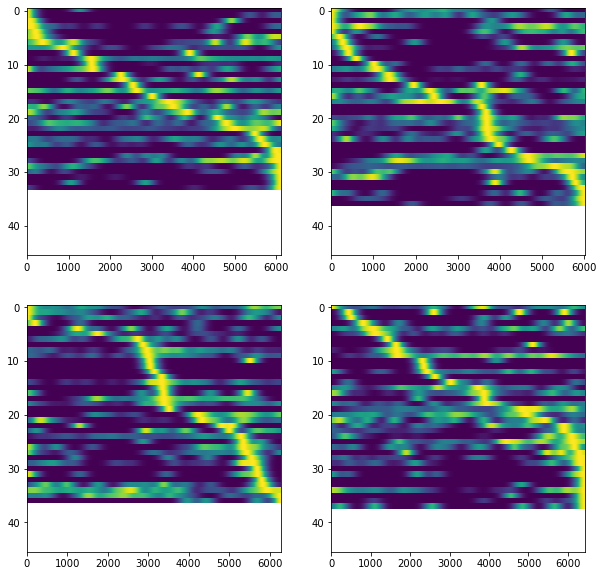

In [403]:
fig, axes = plt.subplots(2,2, figsize = (10,10))

axes[0,0].imshow(sorted_gaussian_3.T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,1].imshow(sorted_gaussian_25.T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,0].imshow(sorted_gaussian_30.T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,1].imshow(sorted_gaussian_31.T, cmap='viridis', interpolation='nearest', aspect='auto')

In [425]:
length = 6433 + 1200
spikes_gaussian_len = get_gaussian_spikes_length(sigma,spiking,end_time, start_time, length)


C:\Users\FORTIN~1\AppData\Local\Temp/ipykernel_22468/198065596.py:9: RuntimeWarning: invalid value encountered in true_divide
  spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))


(0.0, 7633.0)

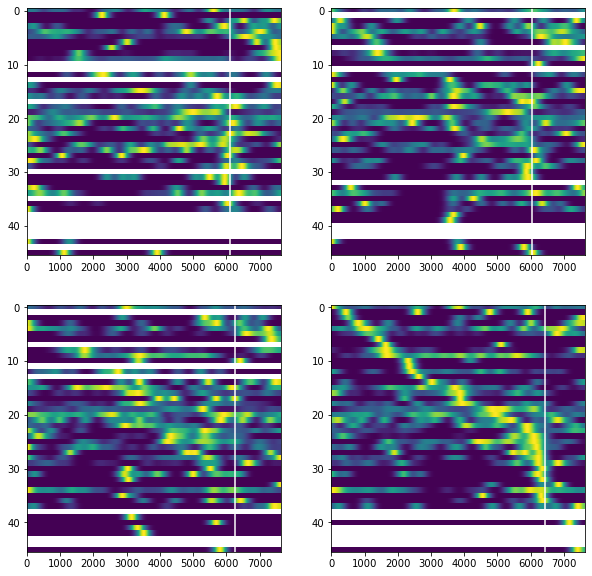

In [426]:
fig, axes = plt.subplots(2,2, figsize = (10,10))

axes[0,0].imshow(spikes_gaussian_len[3][:,sort_idx_31_len].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,0].axvline(x = (pokein_second_odor[3][0][0][0] - pokein_first_odor[3][0][0][0]), color = 'white', label = 'axvline - full height')
axes[0,0].set_xlim([0,length])

axes[0,1].imshow(spikes_gaussian_len[25][:,sort_idx_31_len].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,1].axvline(x = (pokein_second_odor[25][0][0][0] - pokein_first_odor[25][0][0][0]), color = 'white', label = 'axvline - full height')
axes[0,1].set_xlim([0,length])

axes[1,0].imshow(spikes_gaussian_len[30][:,sort_idx_31_len].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,0].axvline(x = (pokein_second_odor[30][0][0][0] - pokein_first_odor[30][0][0][0]), color = 'white', label = 'axvline - full height')
axes[1,0].set_xlim([0,length])

axes[1,1].imshow(spikes_gaussian_len[31][:,sort_idx_31_len].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,1].axvline(x = (pokein_second_odor[31][0][0][0] - pokein_first_odor[31][0][0][0]), color = 'white', label = 'axvline - full height')
axes[1,1].set_xlim([0,length])


In [ ]:
start_time = pokein_first_odor#[trial][0][0][0]
end_time = pokein_second_odor#[trial][0][0][0]
length = 6433 + 1200
spikes_gaussian_len = get_gaussian_spikes_length(sigma,spiking,end_time, start_time, length)


In [427]:
start_time = pokein_second_odor#[trial][0][0][0]
end_time = pokeout_second_odor#[trial][0][0][0]
# length = 6433 + 1200
spikes_gaussian_odor = get_gaussian_spikes(sigma,spiking,end_time, start_time)


[sort_idx_3_odor , sorted_gaussian_3_odor] = sort_neurons(spikes_gaussian_odor, 3)
[sort_idx_25_odor , sorted_gaussian_25_odor] = sort_neurons(spikes_gaussian_odor, 25)
[sort_idx_30_odor , sorted_gaussian_30_odor] = sort_neurons(spikes_gaussian_odor, 30)
[sort_idx_31_odor , sorted_gaussian_31_odor] = sort_neurons(spikes_gaussian_odor, 31)


C:\Users\FORTIN~1\AppData\Local\Temp/ipykernel_22468/1685474044.py:9: RuntimeWarning: invalid value encountered in true_divide
  spikes_gaussian_indiv[:,neuron] = gaussian_filter(spikes[:,neuron],sigma)/np.max(gaussian_filter(spikes[:,neuron],sigma))


(0.0, 1200.0)

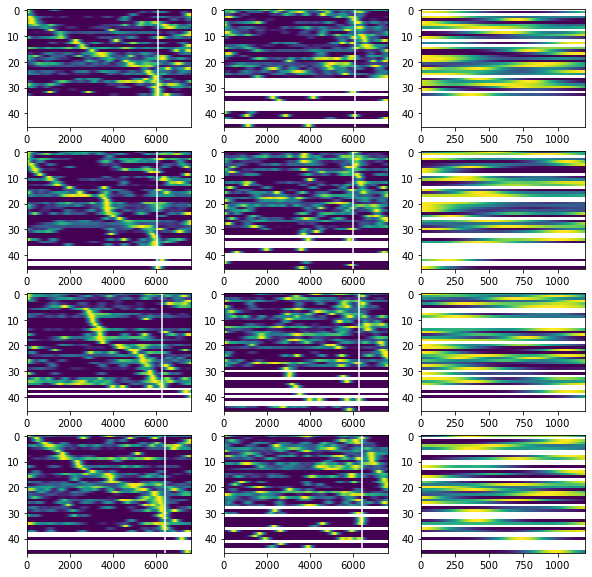

In [431]:
fig, axes = plt.subplots(4,3, figsize = (10,10))

axes[0,0].imshow(spikes_gaussian_len[3][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,0].axvline(x = (pokein_second_odor[3][0][0][0] - pokein_first_odor[3][0][0][0]), color = 'white', label = 'axvline - full height')
axes[0,0].set_xlim([0,length])

axes[0,1].imshow(spikes_gaussian_len[3][:,sort_idx_3_odor].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,1].axvline(x = (pokein_second_odor[3][0][0][0] - pokein_first_odor[3][0][0][0]), color = 'white', label = 'axvline - full height')
axes[0,1].set_xlim([0,length])

axes[0,2].imshow(spikes_gaussian_odor[3][:,sort_idx_3].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,2].axvline(x = (pokein_second_odor[3][0][0][0] - pokein_first_odor[3][0][0][0]), color = 'white', label = 'axvline - full height')
axes[0,2].set_xlim([0,1200])

axes[1,0].imshow(spikes_gaussian_len[25][:,sort_idx_25].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,0].axvline(x = (pokein_second_odor[25][0][0][0] - pokein_first_odor[25][0][0][0]), color = 'white', label = 'axvline - full height')
axes[1,0].set_xlim([0,length])

axes[1,1].imshow(spikes_gaussian_len[25][:,sort_idx_25_odor].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,1].axvline(x = (pokein_second_odor[25][0][0][0] - pokein_first_odor[25][0][0][0]), color = 'white', label = 'axvline - full height')
axes[1,1].set_xlim([0,length])

axes[1,2].imshow(spikes_gaussian_odor[25][:,sort_idx_25].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,2].axvline(x = (pokein_second_odor[25][0][0][0] - pokein_first_odor[25][0][0][0]), color = 'white', label = 'axvline - full height')
axes[1,2].set_xlim([0,1200])

axes[2,0].imshow(spikes_gaussian_len[30][:,sort_idx_30].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[2,0].axvline(x = (pokein_second_odor[30][0][0][0] - pokein_first_odor[30][0][0][0]), color = 'white', label = 'axvline - full height')
axes[2,0].set_xlim([0,length])

axes[2,1].imshow(spikes_gaussian_len[30][:,sort_idx_30_odor].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[2,1].axvline(x = (pokein_second_odor[30][0][0][0] - pokein_first_odor[30][0][0][0]), color = 'white', label = 'axvline - full height')
axes[2,1].set_xlim([0,length])

axes[2,2].imshow(spikes_gaussian_odor[30][:,sort_idx_30].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[2,2].axvline(x = (pokein_second_odor[30][0][0][0] - pokein_first_odor[30][0][0][0]), color = 'white', label = 'axvline - full height')
axes[2,2].set_xlim([0,1200])

axes[3,0].imshow(spikes_gaussian_len[31][:,sort_idx_31].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[3,0].axvline(x = (pokein_second_odor[31][0][0][0] - pokein_first_odor[31][0][0][0]), color = 'white', label = 'axvline - full height')
axes[3,0].set_xlim([0,length])

axes[3,1].imshow(spikes_gaussian_len[31][:,sort_idx_31_odor].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[3,1].axvline(x = (pokein_second_odor[31][0][0][0] - pokein_first_odor[31][0][0][0]), color = 'white', label = 'axvline - full height')
axes[3,1].set_xlim([0,length])

axes[3,2].imshow(spikes_gaussian_odor[31][:,sort_idx_31].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[3,2].axvline(x = (pokein_second_odor[31][0][0][0] - pokein_first_odor[31][0][0][0]), color = 'white', label = 'axvline - full height')
axes[3,2].set_xlim([0,1200])

## select neurons coding for pre poke in, see if their timefield width has changed during pokein trials 

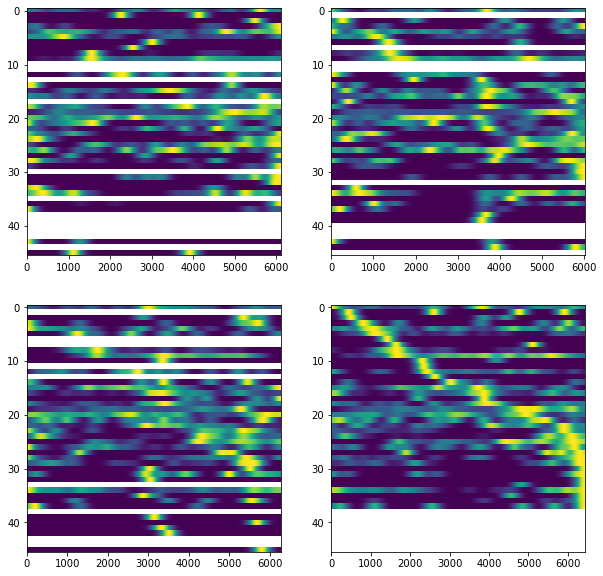

In [404]:
fig, axes = plt.subplots(2,2, figsize = (10,10))

axes[0,0].imshow(spikes_gaussian[3][:,sort_idx_31].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,1].imshow(spikes_gaussian[25][:,sort_idx_31].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,0].imshow(spikes_gaussian[30][:,sort_idx_31].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,1].imshow(spikes_gaussian[31][:,sort_idx_31].T, cmap='viridis', interpolation='nearest', aspect='auto')

In [ ]:
## write a function to visualize the psth from starting point x to end point y . 
# first apply gaussian for spikes between x and y 
# use the sorting function to sort 
# visualize the heatmaps with its own sorting 
# with another sorting 
# visualize both with poke in of the next odor (white line)


(4852, 46)


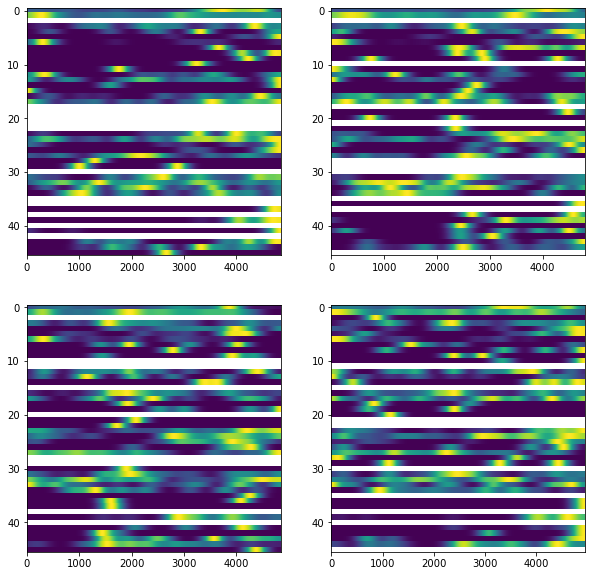

In [268]:
print(spikes_gaussian[3].shape)

# figure(figsize=(10, 100))

fig, axes = plt.subplots(2,2, figsize = (10,10))

axes[0,0].imshow(spikes_gaussian[3].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[0,1].imshow(spikes_gaussian[25].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,0].imshow(spikes_gaussian[30].T, cmap='viridis', interpolation='nearest', aspect='auto')
axes[1,1].imshow(spikes_gaussian[31].T, cmap='viridis', interpolation='nearest', aspect='auto')

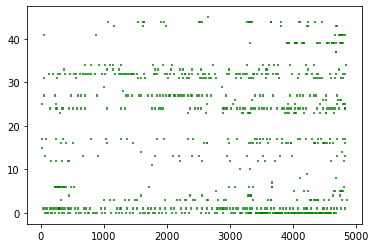

In [171]:
# neurons from the 3rd iti of interest 

spike_int = spiking[pokeout_first_odor[3][0][0][0]:pokein_second_odor[3][0][0][0],1:47]

for neuron in range(46):
#     spike_time = np.zero([1])
    spike_time = [i for i, x in enumerate(spike_int[:,neuron]) if x == 1]
    plt.vlines(spike_time, neuron - 0.25, neuron + 0.25, colors='green')

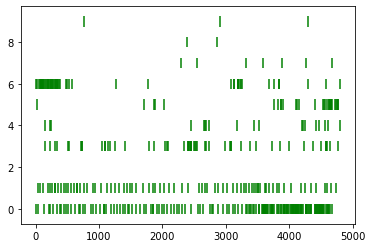

In [179]:
# neurons from the 3rd iti of interest 

spike_int = spiking[pokeout_first_odor[25][0][0][0]:pokein_second_odor[25][0][0][0],1:47]

for neuron in range(10):
#     spike_time = np.zero([1])
    spike_time = [i for i, x in enumerate(spike_int[:,neuron]) if x == 1]
    plt.vlines(spike_time, neuron - 0.25, neuron + 0.25, colors='green')

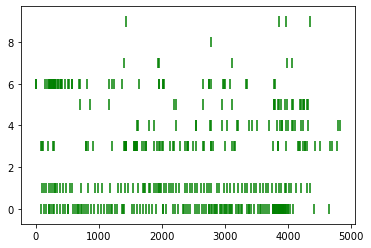

In [177]:
# neurons from the 3rd iti of interest 

spike_int = spiking[pokeout_first_odor[30][0][0][0]:pokein_second_odor[30][0][0][0],1:47]

for neuron in range(10):
#     spike_time = np.zero([1])
    spike_time = [i for i, x in enumerate(spike_int[:,neuron]) if x == 1]
    plt.vlines(spike_time, neuron - 0.25, neuron + 0.25, colors='green')

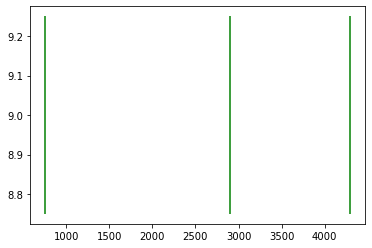

In [181]:
plt.vlines(spike_time, neuron - 0.25, neuron + 0.25, colors='green')

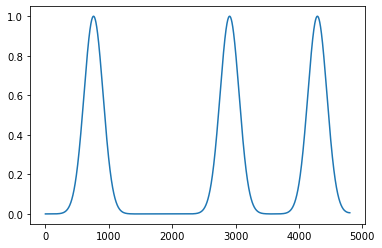

In [194]:
plt.plot(gaussian_filter(spike_int[:,neuron],150)/np.max(gaussian_filter(spike_int[:,neuron],150)))
# plt.plot(ndimage.gaussian_filter1d(spike_int[:,neuron],150)/np.max(ndimage.gaussian_filter1d(spike_int[:,neuron],150)))